In [1]:
import cv2
import math
import numpy as np
from scipy import interpolate
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from scipy.spatial import distance_matrix
from mpl_toolkits.axes_grid1 import AxesGrid

In [2]:
def reshapeComplex(waves):
    waves_shape = np.shape(waves)
    waves_1D = waves.flatten()
    real_1D = waves_1D[0::2]
    imag_1D = waves_1D[1::2]
    frame_num = int(waves_shape[0]/2)
    waves_real = np.reshape(real_1D, (frame_num, waves_shape[1], waves_shape[2]))
    waves_imag = np.reshape(imag_1D, (frame_num, waves_shape[1], waves_shape[2]))
    return waves_real + 1j*waves_imag

In [3]:
#read the object function
obj = np.load('1/obj.npy')
obj = obj[0,:,:]+1j*obj[1,:,:]
#read the corrected position data
pos_new = np.load("1/pos.npy")[0]
#read the initial scanning position
pos_init = np.load("1/pos init.npy")[0]
# data coordinates and values
pos_ref = np.load("pos ref.npy")[0]
x_pos = pos_ref[:, 0]
y_pos = pos_ref[:, 1]
#generate the increase of the scan positions. 
pos_inc = pos_new - pos_init

In [4]:
#determine the affine transformation and remove it.
pos_prev = np.ones((pos_ref.shape[0], 3), pos_ref.dtype)
pos_prev[:,0:2] = pos_ref
left = np.matmul(pos_prev.T, pos_inc)
right = np.matmul(pos_prev.T, pos_prev)
A = np.matmul(np.linalg.inv(right), left)
background =  np.matmul(pos_prev, A)
#remove the middle shift, keep the middle unchanged
pos_inc = pos_inc - background

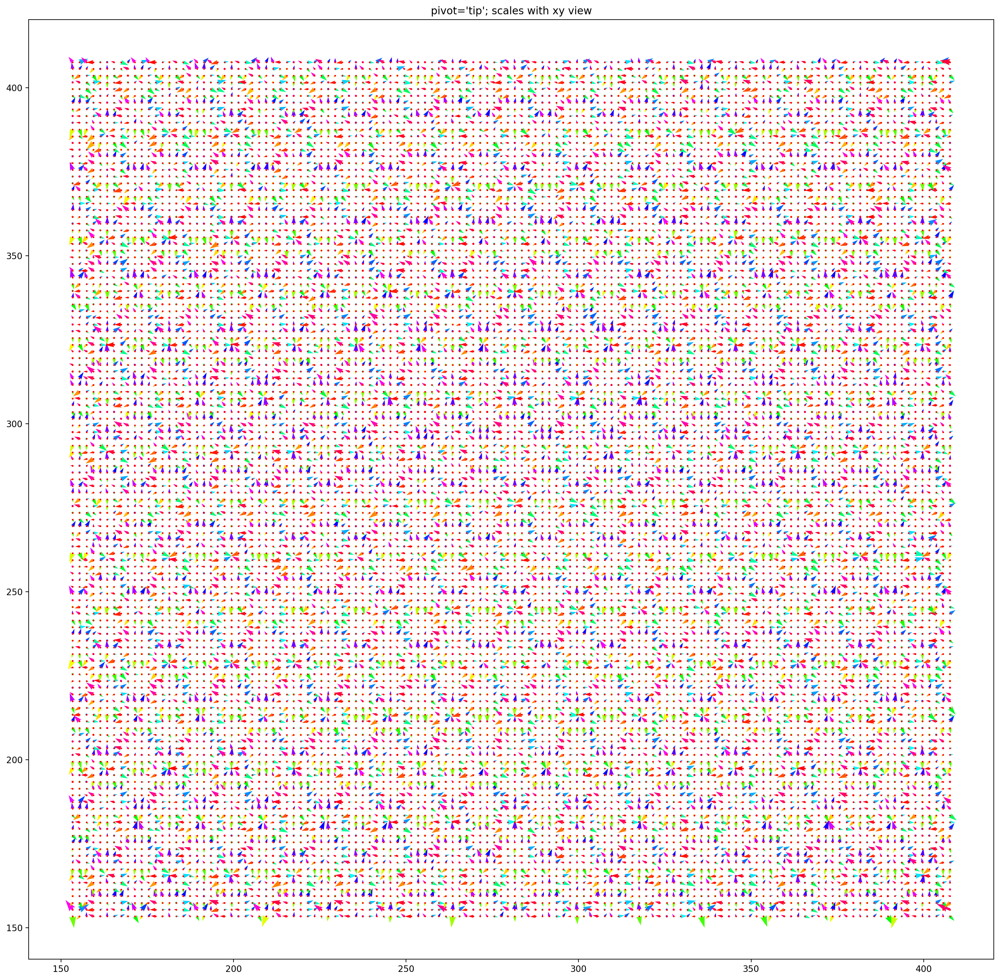

In [5]:
#generate the vector plot on the corrected positions.
plt.rcParams["figure.figsize"] = (20,20)
plt.rcParams["figure.dpi"] = 200
fig1, ax1 = plt.subplots()
ax1.set_title("pivot='tip'; scales with xy view")
M = np.angle(pos_inc[:,0] + 1j*pos_inc[:,1])
Q = ax1.quiver(x_pos, y_pos, pos_inc[:,0], pos_inc[:,1], M, units='xy', pivot='tail',cmap=plt.cm.hsv)
qk = ax1.quiverkey(Q, 0.9, 0.9, 1.0, r'$1 \frac{m}{s}$', labelpos='E', coordinates='figure')
ax1.scatter(x_pos, y_pos, color='r', s=1)
#plt.imshow(np.angle(obj), cmap=plt.cm.gray)
plt.show()

In [6]:
# target grid to interpolate to
X, Y = np.meshgrid(np.arange(0, obj.shape[1]), np.arange(0, obj.shape[0]))
# interpolate
dispy = griddata((x_pos,y_pos),pos_inc[:,1],(X,Y), method='cubic', fill_value= 0.0)
dispy = np.reshape(dispy, obj.shape)
dispx = griddata((x_pos,y_pos),pos_inc[:,0],(X,Y), method='cubic', fill_value= 0.0)
dispx = np.reshape(dispx, obj.shape)
#merge the displacement
disp = dispx + 1j*dispy

Text(0.5, 1.0, 'y displacement')

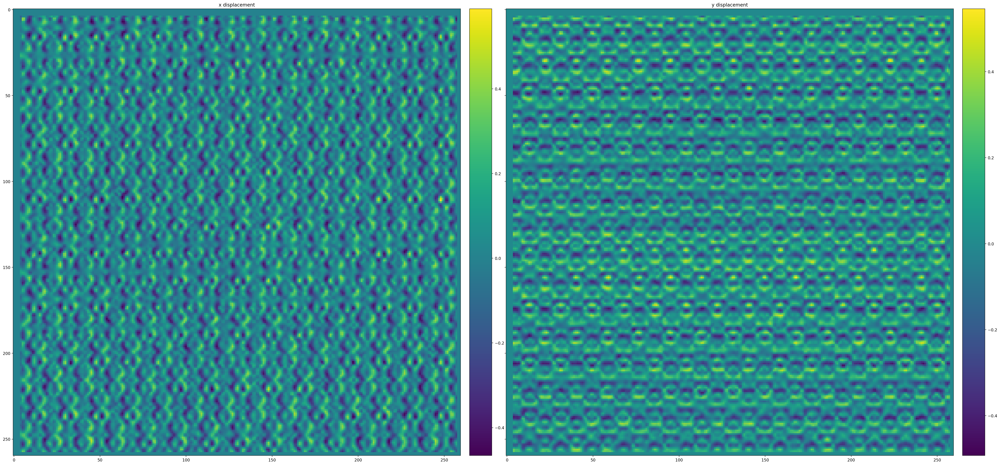

In [7]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(dispx[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(dispy[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

Text(0.5, 1.0, 'object FFT')

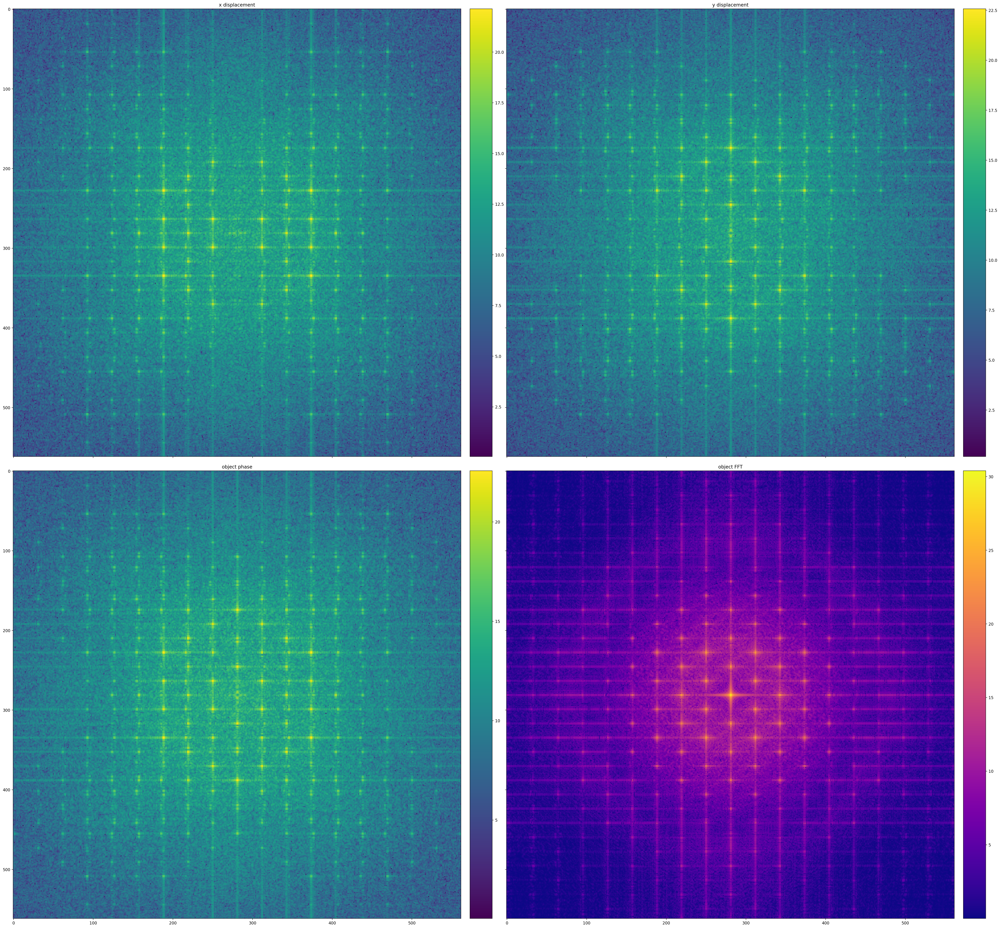

In [8]:
window2d = np.sqrt(np.outer(np.abs(np.hanning(dispx.shape[0])),np.abs(np.hanning(dispx.shape[1]))))
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispx*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispy*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")
im=grid[2].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("object phase")
im=grid[3].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(obj*window2d))))*1000+1.0), cmap=plt.cm.plasma)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("object FFT")

In [9]:
def GeneSimpleHPF(r_map, sigma_val):
    X, Y = np.meshgrid(np.arange(0, r_map.shape[1]), np.arange(0, r_map.shape[0]))
    weight = 1.0-np.exp(-0.5*r_map*r_map/(sigma_val*sigma_val))
    return weight
def GeneRadiusMap(disp):
    #consider the case where width and height have differences.
    min_len = np.min(disp.shape)
    x_coeff = min_len/disp.shape[0]
    y_coeff = min_len/disp.shape[1]
    #generate the normalized radius
    y, x = np.indices((disp.shape))
    centerx = np.round((disp.shape[1]+1)/2)
    centery = np.round((disp.shape[0]+1)/2)
    r = np.sqrt(((x - centerx)*x_coeff)**2 + ((y - centery)*y_coeff)**2)
    r = r.astype(np.int32)
    return r
#define the function find the nearest smallest intensity.
def MaskNearestIntense(peak_mask, intensity, box = 5):
    intensity_back = intensity.copy()
    intensity_back[peak_mask] = -1.0
    for i in range(peak_mask[0].shape[0]):
        x_pos = peak_mask[1][i]
        y_pos = peak_mask[0][i]
        #find the nearby search region
        x_start = x_pos-box
        y_start = y_pos-box
        x_end = x_pos+box
        y_end = y_pos+box
        if x_start<0:
            x_start =0
        if y_start<0:
            y_start =0
        if x_end>disp.shape[1]:
            x_end = disp.shape[1]
        if y_end>disp.shape[0]:
            y_end = disp.shape[0]
        #find the minimum intensity and replace.
        sub_inte = intensity[y_start:y_end,x_start:x_end]
        sub_back = intensity_back[y_start:y_end,x_start:x_end]
        intensity[y_pos, x_pos] = np.min(sub_inte[np.where(sub_back<=0)])
        intensity_back[y_pos, x_pos] = 1.0
    return intensity
def MaskRadialIntense(peak_mask, rmap, intensity):
    #generate the masked radial profile and the radius intensity.
    rmapn = rmap.copy()
    rmapn[peak_mask] = 0
    tbin = np.bincount(rmapn.ravel(), intensity.ravel())
    nr = np.bincount(rmapn.ravel())
    rprofile = tbin/(nr+1e-4)
    nr = np.bincount(rmap.ravel())
    rprofile = np.reshape(rprofile, (nr.shape[0],))
    #generate the corresponding new intensity for the masked pixels.
    new_intensity = rprofile[rmap]
    intensity[peak_mask] = new_intensity[peak_mask]/2
    return intensity

In [10]:
#generate the radial profile for the whole displacement map
#normalize the pixels with intensity higher than the averaged.
def RadialHPF(disp, fill_mode = "radial", threshold = 2.0):
    disp_fft = np.fft.fftshift(np.fft.fft2(disp))
    intensity = np.abs(disp_fft)
    phase_val = np.angle(disp_fft)
    #generate the radial profile to find the pixels to be replaced.
    r = GeneRadiusMap(disp)
    weight = GeneSimpleHPF(r, 7.0)
    tbin = np.bincount(r.ravel(), intensity.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin/nr
    new_intensity = radialprofile[r]
    masked_pix = np.where(intensity>threshold*new_intensity)
    #update the radial profile.
    if fill_mode == "radial":
        intensity = MaskRadialIntense(masked_pix, r, intensity)
    else:
        intensity = MaskNearestIntense(masked_pix, intensity, box = 5)
    #high pass filtering.
    intensity = intensity*weight
    return np.fft.ifft2(np.fft.ifftshift(intensity*np.exp(1j*phase_val)))
def PlaneHPF(disp, fill_mode = "radial", ratio = 1.0, radius = 6.0):
    log_coeff = 1e3
    disp_fft = np.fft.fftshift(np.fft.fft2(disp))
    intensity = np.abs(disp_fft)
    phase_val = np.angle(disp_fft)
    #generate the radius limitation.
    r = GeneRadiusMap(disp)
    weight = GeneSimpleHPF(r, 7.0)
    #generate the log intensity
    intensity_log = np.log(np.square(np.abs(disp_fft))*log_coeff+1.0)
    #update the new intensity
    peak_mask = np.where((intensity_log>np.average(intensity_log)*ratio)&(r>radius))
    #replace the intensity by the nearest smallest/averaged intensity
    if fill_mode == "radial":
        intensity = MaskRadialIntense(peak_mask, r, intensity)
    else:
        intensity = MaskNearestIntense(peak_mask, intensity, box = 5)
    #high pass filtering.
    intensity = intensity*weight
    return np.fft.ifft2(np.fft.ifftshift(intensity*np.exp(1j*phase_val)))

In [11]:
disp_filter1 = RadialHPF(disp, fill_mode= "radial", threshold=1.0)
disp_filter2 = RadialHPF(disp, fill_mode= "plane", threshold=1.0)
disp_filter3 = PlaneHPF(disp, fill_mode= "radial", ratio=1.0)
disp_filter4 = PlaneHPF(disp, fill_mode= "plane", ratio=1.0)

Text(0.5, 1.0, 'Plane HPF, Plane Fill')

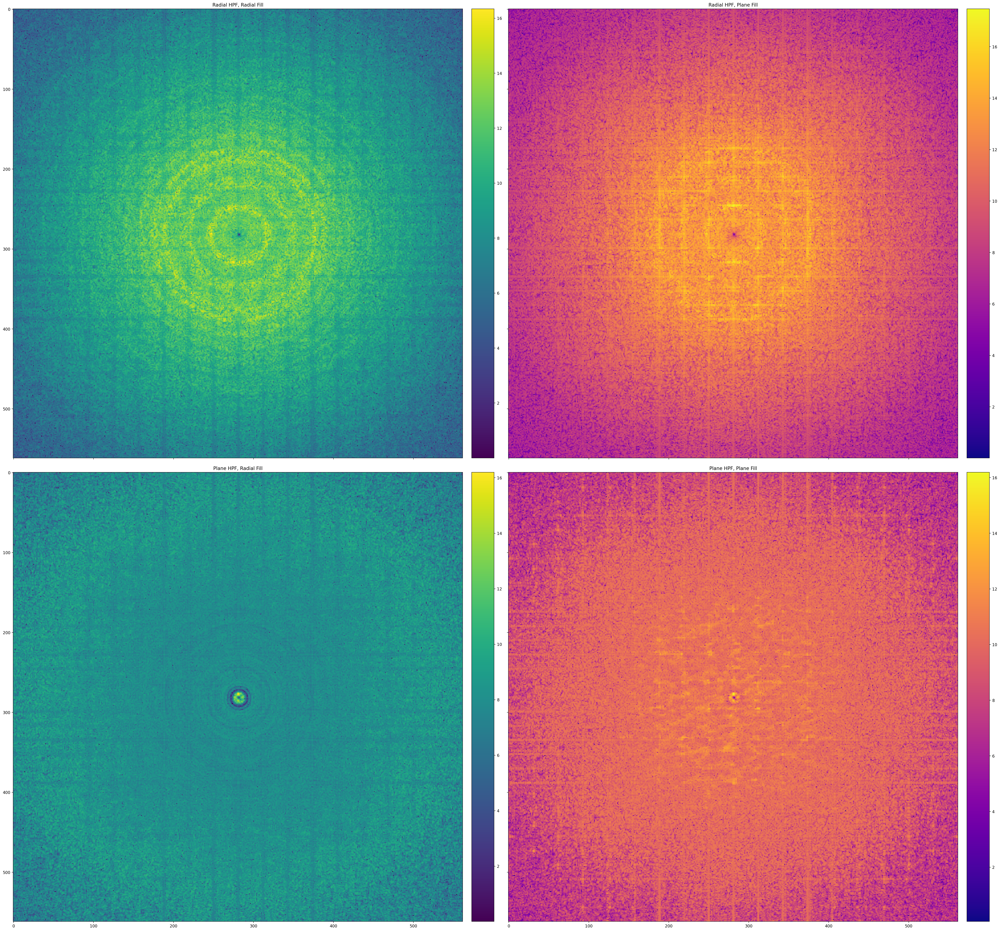

In [12]:
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp_filter1*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("Radial HPF, Radial Fill")
im=grid[1].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp_filter2*window2d))))*1000+1.0), cmap=plt.cm.plasma)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("Radial HPF, Plane Fill")
im=grid[2].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp_filter3*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("Plane HPF, Radial Fill")
im=grid[3].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp_filter4*window2d))))*1000+1.0), cmap=plt.cm.plasma)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("Plane HPF, Plane Fill")

Text(0.5, 1.0, 'x displacement')

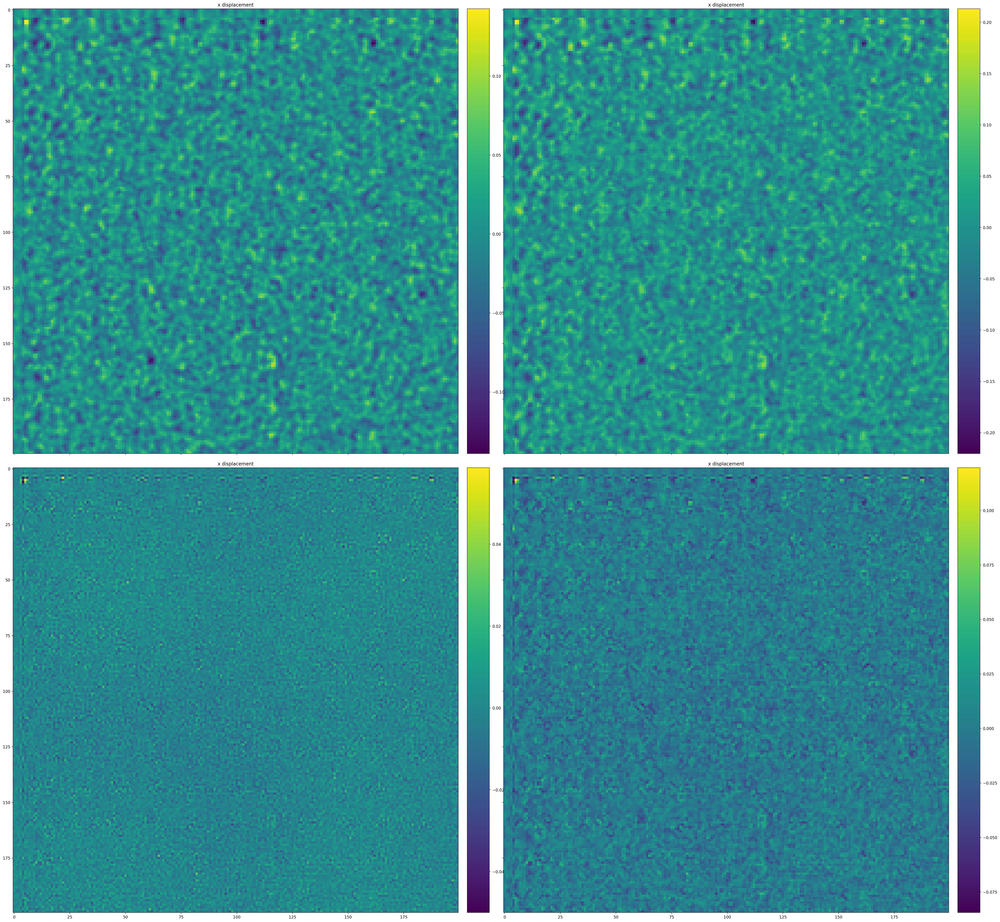

In [13]:
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.real(disp_filter1)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.real(disp_filter2)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("x displacement")
im=grid[2].imshow(np.real(disp_filter3)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("x displacement")
im=grid[3].imshow(np.real(disp_filter4)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("x displacement")

Text(0.5, 1.0, 'y displacement')

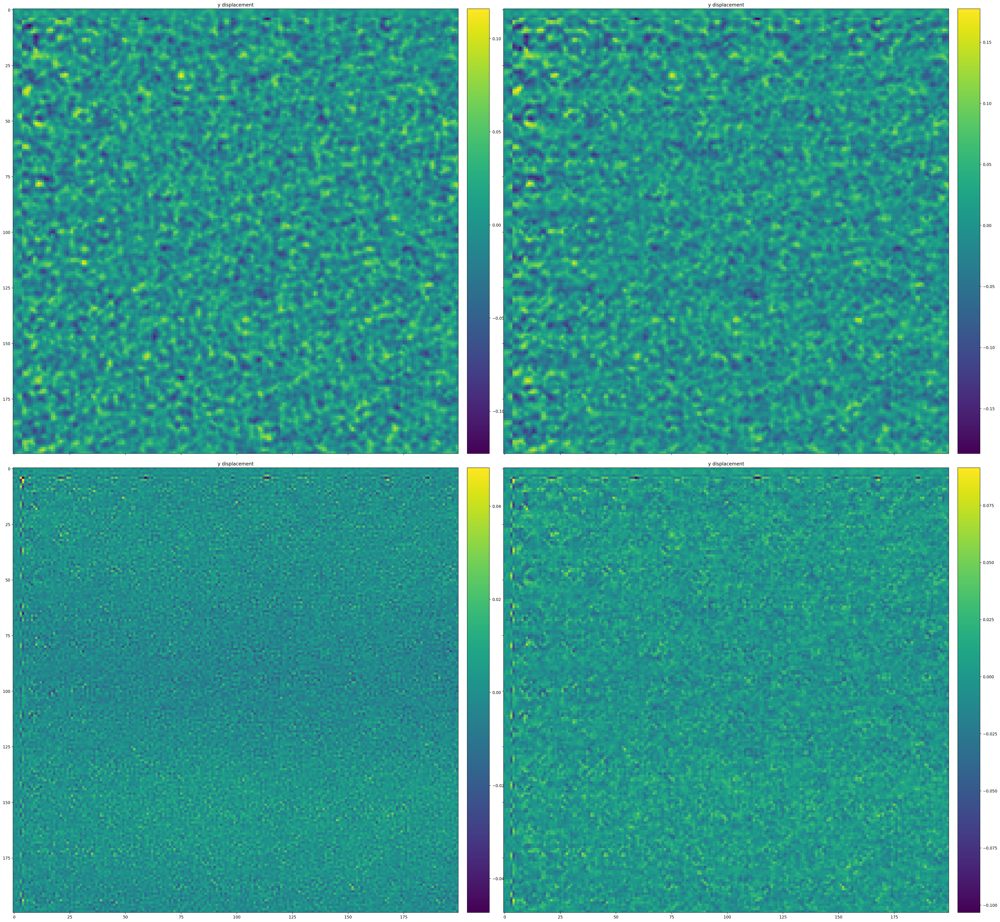

In [14]:
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.imag(disp_filter1)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("y displacement")
im=grid[1].imshow(np.imag(disp_filter2)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")
im=grid[2].imshow(np.imag(disp_filter3)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("y displacement")
im=grid[3].imshow(np.imag(disp_filter4)[150:350,150:350], cmap=plt.cm.viridis)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("y displacement")